# ERA5 Verification for the 2023 Heatwave

This notebook will use ERA5 data to see how the 2023 US Heatwave was handled for reanalysis.

Specifically, this notebook will look at cloud cover and 2m temperature.

In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import datetime as dt
from metpy.units import units
import metpy.calc as mpcalc
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt

Choosing the dates for our event of interest.

In [2]:
start_date = '20230714/00'
end_date = '20230717/00'

interval_hours = 6

interval_hours = dt.timedelta(hours=interval_hours)
sdate = dt.datetime.strptime(start_date,'%Y%m%d/%H')
edate = dt.datetime.strptime(end_date,'%Y%m%d/%H') + interval_hours

yyyymm = dt.datetime.strftime(sdate,'%Y%m')

Opening the dataset!

In [3]:
ds = xr.open_dataset(
  'https://data.earthdatahub.destine.eu/era5/reanalysis-era5-single-levels-v0.zarr', 
  chunks={}, storage_options={"client_kwargs":{"trust_env":True}}, consolidated=True, engine="zarr"
  )
data = ds.sel(valid_time=slice(sdate, edate))

Setting up the areal extent.

In [4]:
lonW = -127
lonE = -67
latS = 20
latN = 48
cLat, cLon = (latS + latN)/2, (lonW + lonE)/2

# converting to conventional longitude format
if (lonW < 0 ):
    lonW = lonW + 360
if (lonE < 0 ):
    lonE = lonE + 360
    
expand = 1
latRange = np.arange(latS - expand,latN + expand,.25)
lonRange = np.arange((lonW - expand),(lonE + expand),.25)

# further limiting our data set to contain just the desired latitude and longitude ranges
data = data.sel(latitude=latRange,longitude=lonRange)
data

<xarray.Dataset> Size: 1GB
Dimensions:     (valid_time: 79, latitude: 120, longitude: 248)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 632B 2023-07-14 ... 2023-07-17T06...
  * latitude    (latitude) float64 960B 19.0 19.25 19.5 ... 48.25 48.5 48.75
  * longitude   (longitude) float64 2kB 232.0 232.2 232.5 ... 293.2 293.5 293.8
    number      int64 8B ...
    surface     float64 8B ...
Data variables: (12/128)
    alnid       (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    alnip       (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    aluvd       (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    aluvp       (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    anor        (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    asn         (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    ...          ...
    viiwn       (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    vilwd       (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    vilwe       (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    vilwn       (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    z           (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
    zust        (valid_time, latitude, longitude) float32 9MB dask.array<chunksize=(79, 60, 62), meta=np.ndarray>
Attributes:
    Conventions:             CF-1.7
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_edition:            1
    GRIB_subCentre:          0
    history:                 2025-02-13T19:10 GRIB to CDM+CF via cfgrib-0.9.1...
    institution:             European Centre for Medium-Range Weather Forecasts

Extracting the variables of interest.

In [5]:
cloud = data['tcc']
temp = data['t2m']
temp = (temp - 273.15) * 9/5 + 32
lats = temp.latitude
lons = temp.longitude

Plotting the map.

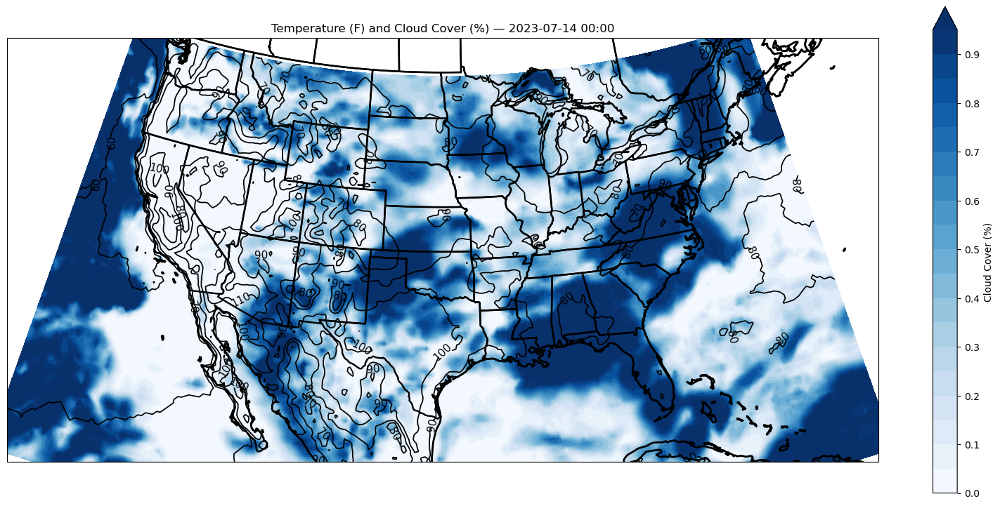

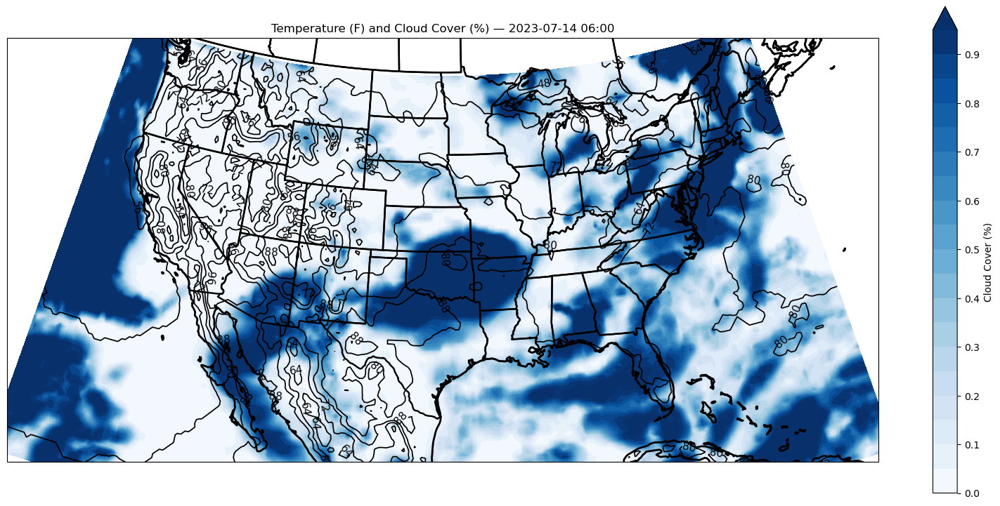

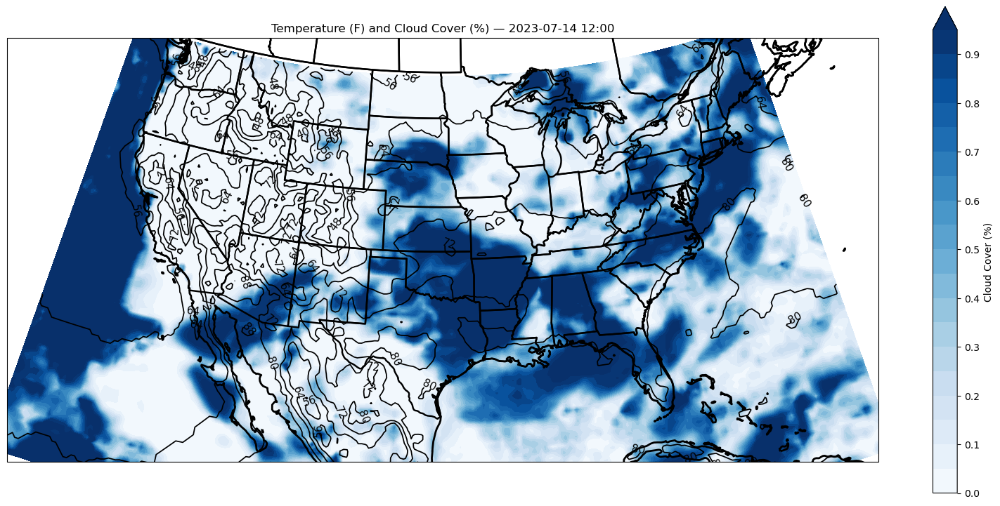

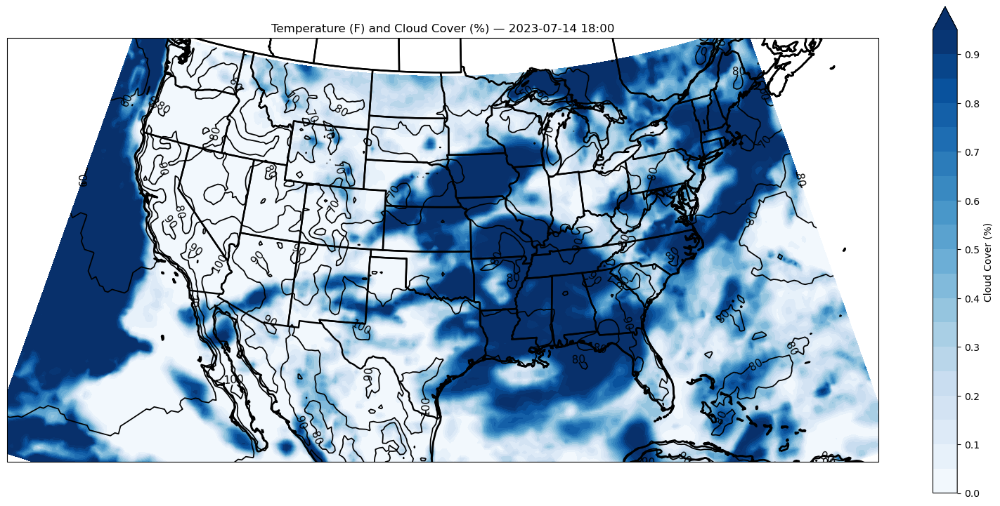

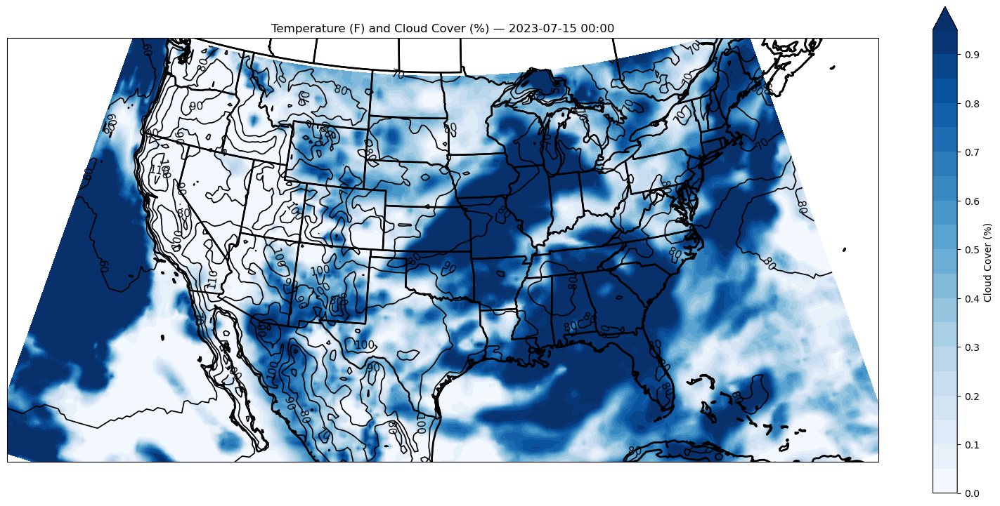

...

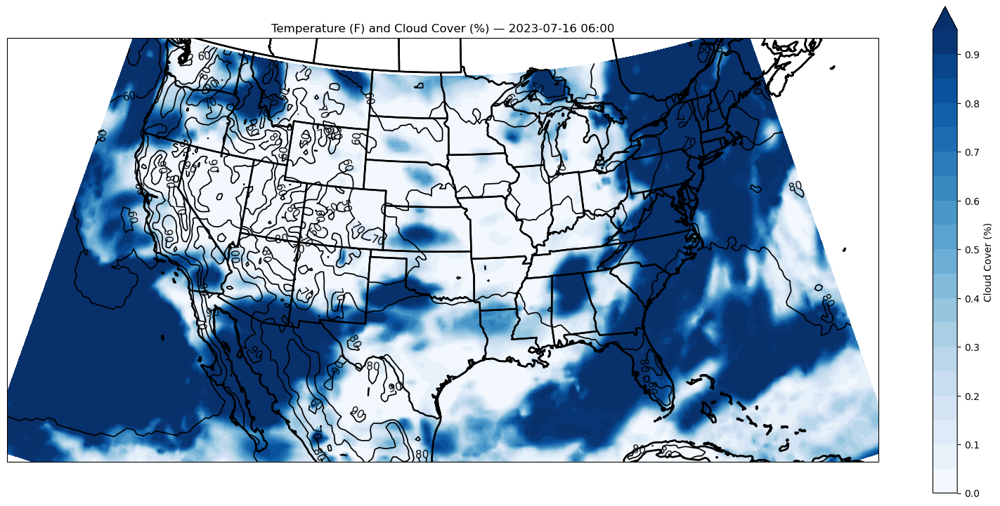

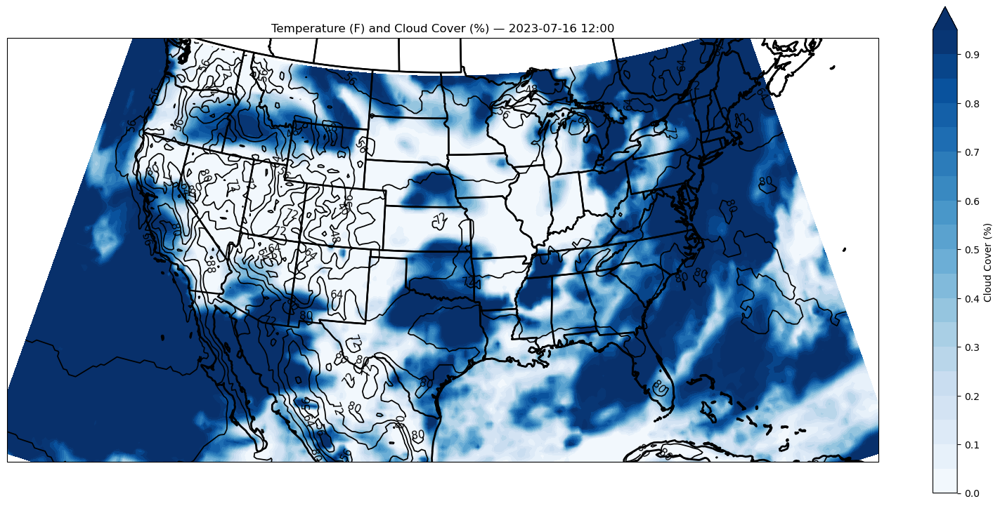

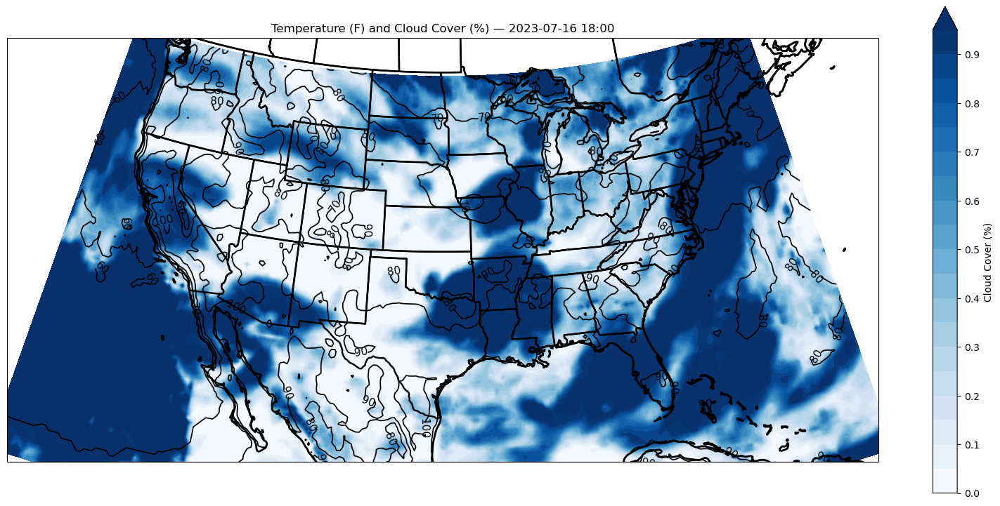

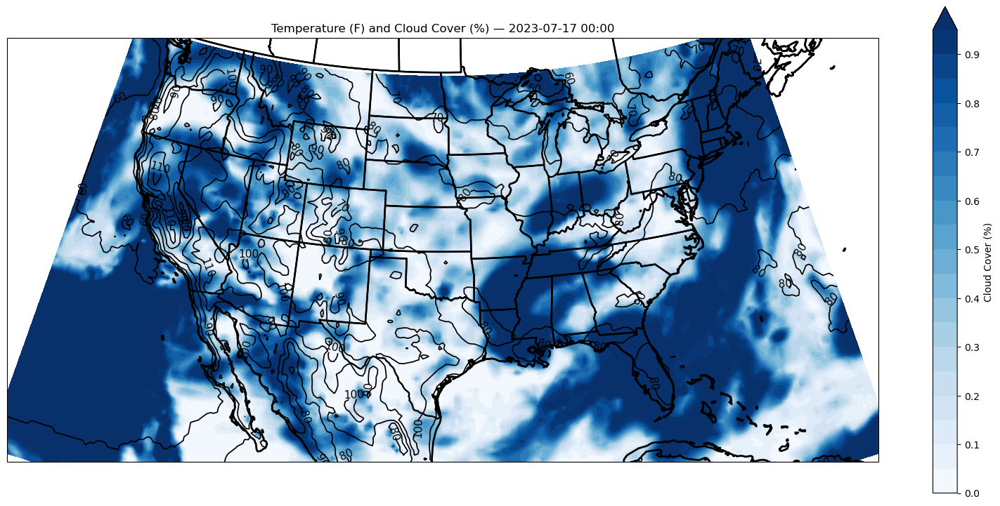

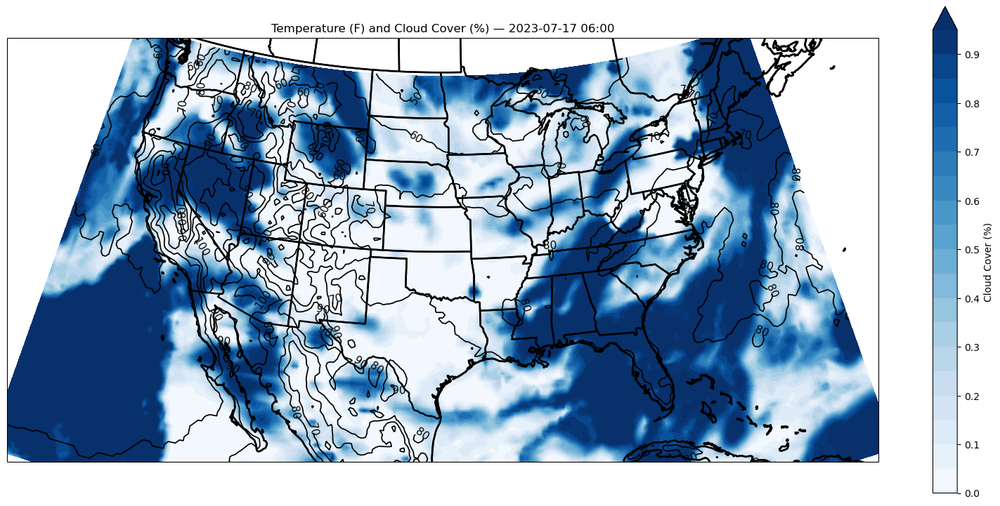

In [6]:
proj_map = ccrs.LambertConformal(central_longitude=cLon, central_latitude=cLat)
proj_data = ccrs.PlateCarree() 
res = '50m'

# some help making the loop skip every 12 hours with chatgpt!
for t in temp.valid_time.sel(valid_time=temp.valid_time.dt.hour.isin([0, 6, 12, 18])):
    fig, ax = plt.subplots(subplot_kw={'projection': proj_map}, figsize=(20,15))
    ax.set_extent([lonW, lonE, latS, latN])
    ax.add_feature(cfeature.COASTLINE.with_scale(res),linewidth=2)
    ax.add_feature(cfeature.STATES.with_scale(res),linewidth=1.75)

    temps = np.arange(50,120,5)
    CL = ax.contour(lons, lats, temp.sel(valid_time=t), transform=proj_data,
                    linewidths=1.25, colors='black')
    tint = np.arange(0,1,0.05)
    CF = ax.contourf(lons, lats, cloud.sel(valid_time=t), levels=tint, transform=proj_data,
                     cmap='Blues', extend='max')
    cbar = fig.colorbar(CF,shrink=0.6,label = 'Cloud Cover (%)')
    clabel = ax.clabel(CL, inline_spacing=0.2, fontsize=11, fmt='%.0f')

    ax.set_title(f"Temperature (F) and Cloud Cover (%) — {t.dt.strftime('%Y-%m-%d %H:%M').item()}")
    plt.show()

Finally, we have created maps centered over our area of interest, the lower 48 United States, and plotted the cloud cover in shading along with contour lines of the temperature values.

Now we will shift gears and look at how we can create a deeper understanding of these events through radar and satellite imagery.